### RESUME CATEGORIZATION

ESSENTIAL LIBRARIES

In [1]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.metrics import confusion_matrix,classification_report
from collections import Counter
from wordcloud import WordCloud

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer

#classifier
from sklearn.model_selection import train_test_split

from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, accuracy_score

print("Library install successfully")

Library install successfully


LOADING DATASETS

In [2]:
# load resume.csv dataset using by pandas.
data=pd.read_csv('Resume/Resume.csv')

# Split the data into train and test sets
resume_data, resume_test_data = train_test_split(data, test_size=0.15,stratify=data['Category'], random_state=42)

# Save the test data to CSV files
#resume_test_data.to_csv('test_resume_data.csv', index=False)

In [3]:
resume_data.head()

,ID,Resume_str,Resume_html,Category
1443,16066857,SENIOR EXECUTIVE CHEF Execu...,"<div class=""fontsize fontface vmargins hmargin...",CHEF
56,52979663,SENIOR HR Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR
1131,15281412,CONSULTANT Summary Transitio...,"<div class=""fontsize fontface vmargins hmargin...",CONSULTANT
2472,16279537,SUPERVISORY LOGISTICS MANAGEMENT SPEC...,"<div class=""fontsize fontface vmargins hmargin...",AVIATION
1710,24647794,ENGINEERING INTERN Profile ...,"<div class=""fontsize fontface vmargins hmargin...",ENGINEERING


In [4]:
resume_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2111 entries, 1443 to 1999
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   ID           2111 non-null   int64 
 1   Resume_str   2111 non-null   object
 2   Resume_html  2111 non-null   object
 3   Category     2111 non-null   object
dtypes: int64(1), object(3)
memory usage: 82.5+ KB


In [5]:
resume_data.shape

(2111, 4)

In [6]:
resume_data['Category'].unique()

array(['CHEF', 'HR', 'CONSULTANT', 'AVIATION', 'ENGINEERING', 'BANKING',
       'BUSINESS-DEVELOPMENT', 'ADVOCATE', 'FINANCE', 'DIGITAL-MEDIA',
       'CONSTRUCTION', 'HEALTHCARE', 'DESIGNER', 'AGRICULTURE', 'ARTS',
       'FITNESS', 'TEACHER', 'PUBLIC-RELATIONS', 'APPAREL',
       'INFORMATION-TECHNOLOGY', 'ACCOUNTANT', 'SALES', 'BPO',
       'AUTOMOBILE'], dtype=object)

In [7]:
resume_data['Category'].value_counts()

Category
BUSINESS-DEVELOPMENT      102
INFORMATION-TECHNOLOGY    102
ENGINEERING               100
CHEF                      100
FINANCE                   100
ACCOUNTANT                100
ADVOCATE                  100
AVIATION                   99
SALES                      99
FITNESS                    99
CONSULTANT                 98
BANKING                    98
HEALTHCARE                 98
CONSTRUCTION               95
PUBLIC-RELATIONS           94
HR                         93
DESIGNER                   91
ARTS                       88
TEACHER                    87
DIGITAL-MEDIA              82
APPAREL                    82
AGRICULTURE                54
AUTOMOBILE                 31
BPO                        19
Name: count, dtype: int64

### EXPLORRATORY DATA ANALYSIS

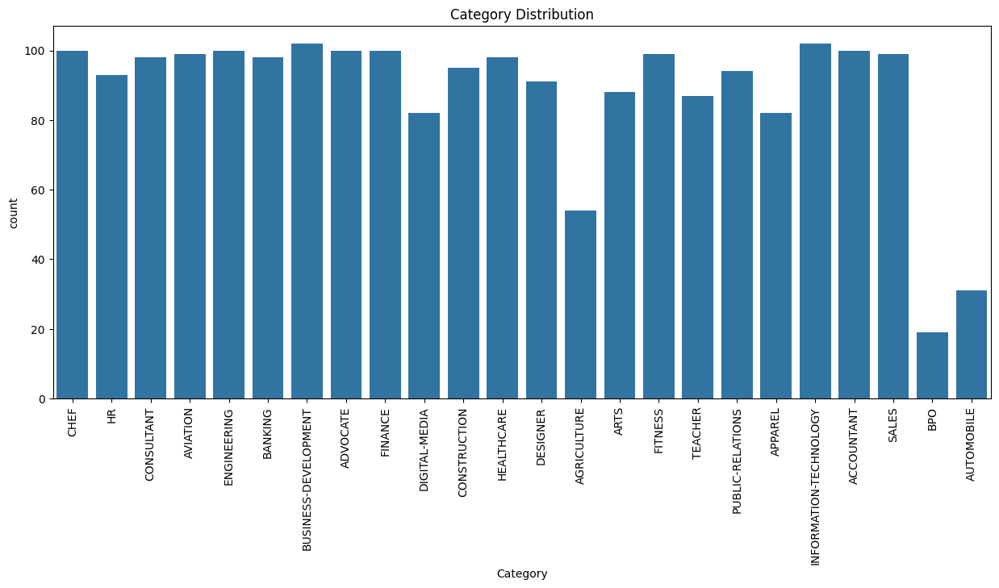

In [8]:
# Visualize the distribution of categories
plt.figure(figsize=(15, 6))
sns.countplot(x=resume_data['Category'])
plt.xticks(rotation=90)
plt.title('Category Distribution')
plt.show()

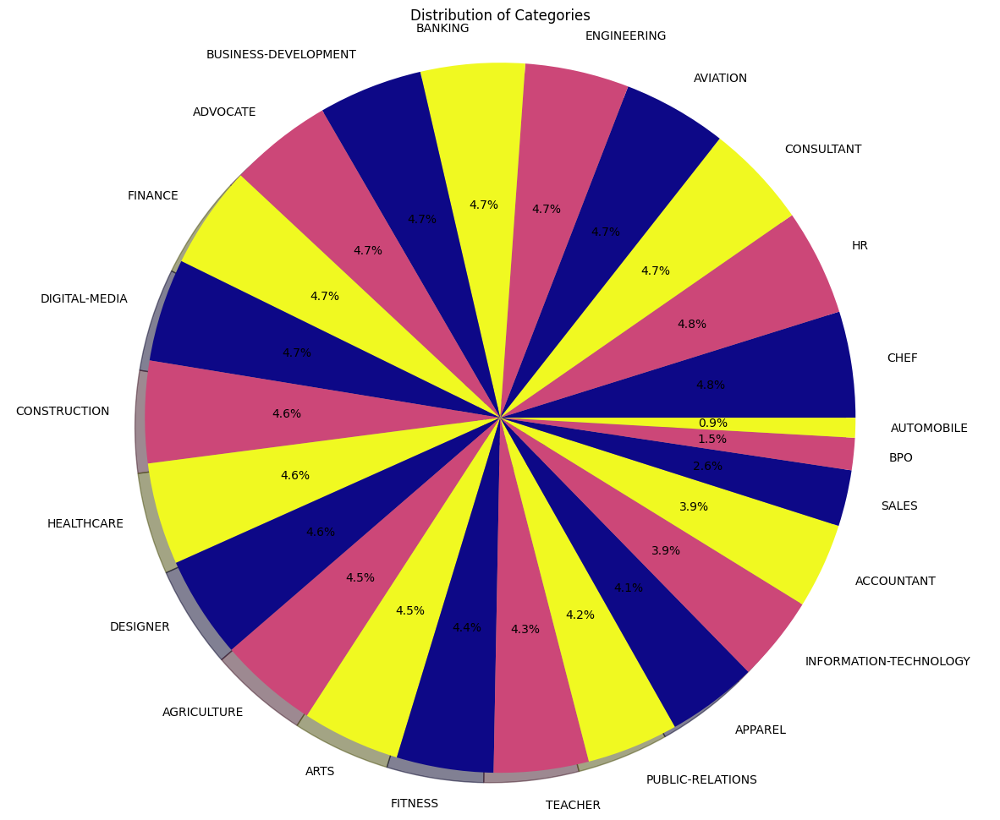

In [9]:

counts=resume_data['Category'].value_counts()
labels=resume_data['Category'].unique()

plt.figure(figsize=(15,12))
plt.pie(counts,labels= labels, autopct='%1.1f%%',shadow=True, colors=plt.cm.plasma(np.linspace(0,1,3)))
plt.title('Distribution of Categories')
plt.axis('equal')  
plt.show()

In [10]:
%pip install plotly


Note: you may need to restart the kernel to use updated packages.


In [11]:
%pip install --upgrade nbformat


  Using cached nbformat-5.10.4-py3-none-any.whl.metadata (3.6 kB)
  Using cached fastjsonschema-2.21.1-py3-none-any.whl.metadata (2.2 kB)
  Using cached jsonschema-4.23.0-py3-none-any.whl.metadata (7.9 kB)
  Using cached attrs-25.1.0-py3-none-any.whl.metadata (10 kB)
  Using cached jsonschema_specifications-2024.10.1-py3-none-any.whl.metadata (3.0 kB)
  Using cached referencing-0.36.2-py3-none-any.whl.metadata (2.8 kB)
  Using cached rpds_py-0.22.3-cp39-cp39-win_amd64.whl.metadata (4.2 kB)
Using cached nbformat-5.10.4-py3-none-any.whl (78 kB)
Using cached fastjsonschema-2.21.1-py3-none-any.whl (23 kB)
Using cached jsonschema-4.23.0-py3-none-any.whl (88 kB)
Using cached attrs-25.1.0-py3-none-any.whl (63 kB)
Using cached jsonschema_specifications-2024.10.1-py3-none-any.whl (18 kB)
Using cached referencing-0.36.2-py3-none-any.whl (26 kB)
Using cached rpds_py-0.22.3-cp39-cp39-win_amd64.whl (231 kB)
Note: you may need to restart the kernel to use updated packages.


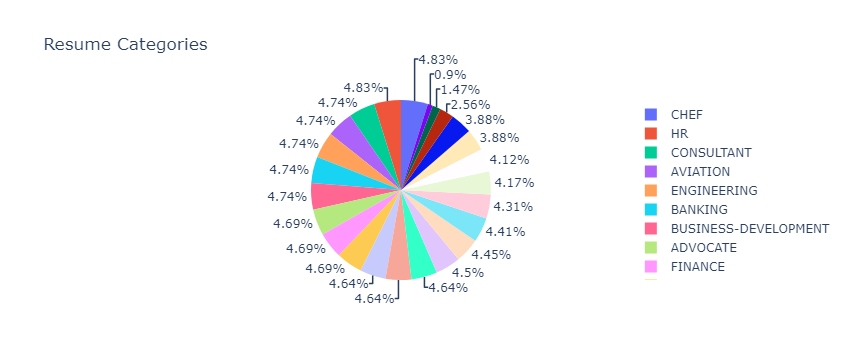

In [12]:
import plotly.graph_objects as go

# Count the occurrences of each category
counts=resume_data['Category'].value_counts()
labels=resume_data['Category'].unique()

# Create a pie chart using Plotly
fig = go.Figure(data=[go.Pie(labels=labels, values=counts)])

# Set layout options
fig.update_layout(title='Resume Categories')

# Show the pie chart
fig.show()

In [13]:
# Count the occurrences of each category
category_counts = resume_data['Category'].value_counts()

# Create a DataFrame with unique category names and their counts
category_counts_df = category_counts.reset_index()
category_counts_df.columns = ['Category', 'Count']

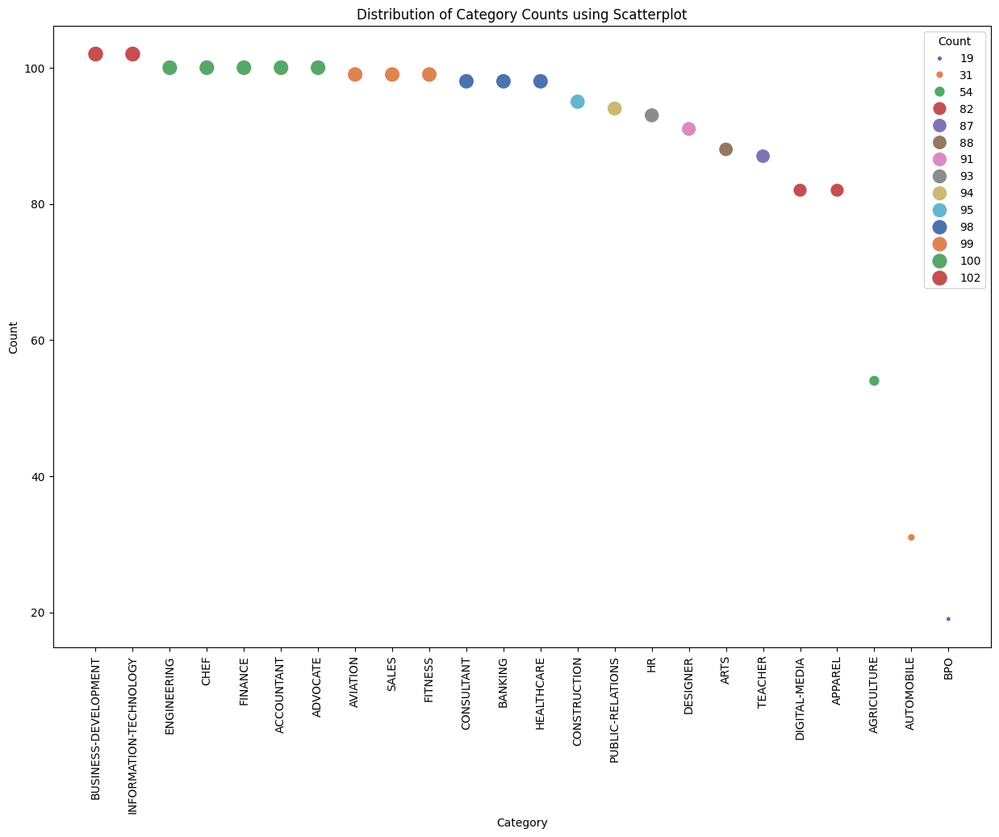

In [14]:
plt.figure(figsize=(15, 10))
sns.scatterplot(data=category_counts_df, x="Category", y="Count" ,size="Count",hue="Count", sizes=(20, 200), hue_norm=(0, 7), palette="deep",legend="full")
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Distribution of Category Counts using Scatterplot')
plt.xticks(rotation=90)
plt.show()

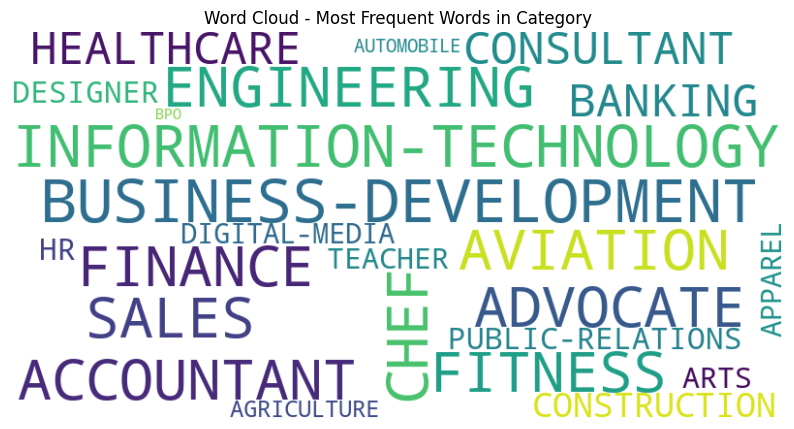

In [15]:
# Combine text from Category columns
combined_text = ' '.join(resume_data['Category'])

# Tokenize and count word frequency
word_counts = Counter(combined_text.split())

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Frequent Words in Category')
plt.show()

## HANDLING MISSING VALUES AND TEXT CLEANING

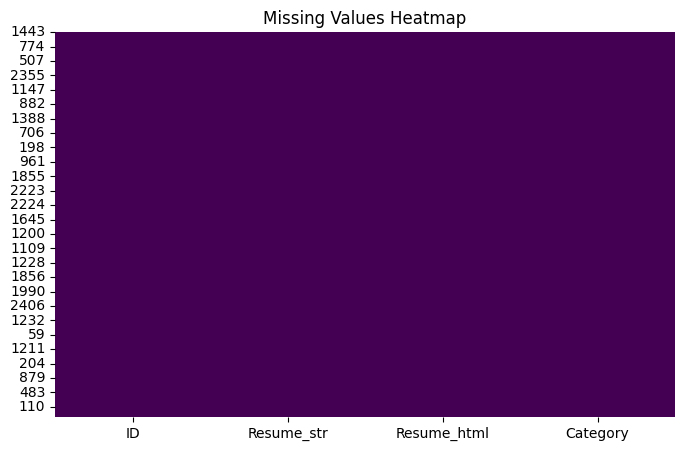

In [16]:
missing_values = resume_data.isnull().sum()
# Visualize missing values
plt.figure(figsize=(8, 5))
sns.heatmap(resume_data.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

In [17]:
print(resume_data['Resume_str'][0])

         HR ADMINISTRATOR/MARKETING ASSOCIATE

HR ADMINISTRATOR       Summary     Dedicated Customer Service Manager with 15+ years of experience in Hospitality and Customer Service Management.   Respected builder and leader of customer-focused teams; strives to instill a shared, enthusiastic commitment to customer service.         Highlights         Focused on customer satisfaction  Team management  Marketing savvy  Conflict resolution techniques     Training and development  Skilled multi-tasker  Client relations specialist           Accomplishments      Missouri DOT Supervisor Training Certification  Certified by IHG in Customer Loyalty and Marketing by Segment   Hilton Worldwide General Manager Training Certification  Accomplished Trainer for cross server hospitality systems such as    Hilton OnQ  ,   Micros    Opera PMS   , Fidelio    OPERA    Reservation System (ORS) ,   Holidex    Completed courses and seminars in customer service, sales strategies, inventory control, loss preve

In [18]:

def resume_cleaning(text):
    
    # Remove HTML tags 
    cleaned_text = re.sub(r'<.*?>', ' ', text)
    
    # Remove non-english characters, punctuation,special characters, digits, continous underscores and extra whitespace
    cleaned_text = re.sub('[^a-zA-Z]', ' ', cleaned_text)
    cleaned_text = re.sub(r'[^\w\s]|_', ' ', cleaned_text)
    cleaned_text = re.sub(r'\d+', ' ', cleaned_text)
    cleaned_text = re.sub(r'\s+', ' ', cleaned_text).strip()
    cleaned_text = re.sub(r'http\S+\s', " ", cleaned_text)

    
    
    
    # Convert to lowercase
    cleaned_text = cleaned_text.lower()
    
    # Tokenize the cleaned text
    words = word_tokenize(cleaned_text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    filtered_words = [word for word in words if word not in stop_words]
    
    # Tokenize the cleaned text
    words = word_tokenize(cleaned_text)
    
    # Apply stemming
    stemmer = PorterStemmer()
    stemmed_words = [stemmer.stem(word) for word in filtered_words]
    
    cleaned_text = ' '.join(stemmed_words)
    
    return cleaned_text

In [19]:
resume_data['Cleaned_Resume'] = resume_data['Resume_str'].apply(lambda x: resume_cleaning(x))


In [20]:
resume_data.head()

,ID,Resume_str,Resume_html,Category,Cleaned_Resume
1443,16066857,SENIOR EXECUTIVE CHEF Execu...,"<div class=""fontsize fontface vmargins hmargin...",CHEF,senior execut chef execut profil seek employ e...
56,52979663,SENIOR HR Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR,senior hr highlight safeti managementemploye e...
1131,15281412,CONSULTANT Summary Transitio...,"<div class=""fontsize fontface vmargins hmargin...",CONSULTANT,consult summari transit applic develop secur p...
2472,16279537,SUPERVISORY LOGISTICS MANAGEMENT SPEC...,"<div class=""fontsize fontface vmargins hmargin...",AVIATION,supervisori logist manag specialist summari ta...
1710,24647794,ENGINEERING INTERN Profile ...,"<div class=""fontsize fontface vmargins hmargin...",ENGINEERING,engin intern profil profici entri level electr...


In [21]:
# check any internal pdf are empty or not after cleaning procedure.

empty_rows = resume_data[resume_data['Cleaned_Resume'] == '']
print(empty_rows)

           ID             Resume_str  \
656  12632728                          

                                           Resume_html              Category  \
656  <div class="fontsize fontface vmargins hmargin...  BUSINESS-DEVELOPMENT   

    Cleaned_Resume  
656                 


In [22]:
# Drop 'Resume_str' and "Resume_html" columns
resume_data=resume_data.drop(['Resume_str', 'Resume_html'], axis=1)

# Drop the rows with empty cleaned text
resume_data = resume_data.drop(empty_rows.index)

In [23]:
resume_data.Cleaned_Resume[0]

'hr administr market associ hr administr summari dedic custom servic manag year experi hospit custom servic manag respect builder leader custom focus team strive instil share enthusiast commit custom servic highlight focus custom satisfact team manag market savvi conflict resolut techniqu train develop skill multi tasker client relat specialist accomplish missouri dot supervisor train certif certifi ihg custom loyalti market segment hilton worldwid gener manag train certif accomplish trainer cross server hospit system hilton onq micro opera pm fidelio opera reserv system or holidex complet cours seminar custom servic sale strategi inventori control loss prevent safeti time manag leadership perform assess experi hr administr market associ hr administr dec current compani name citi state help develop polici direct coordin activ employ compens labor relat benefit train employe servic prepar employe separ notic relat document keep record benefit plan particip insur pension plan personnel t

In [24]:
categories = np.sort(resume_data['Category'].unique())
categories

array(['ACCOUNTANT', 'ADVOCATE', 'AGRICULTURE', 'APPAREL', 'ARTS',
       'AUTOMOBILE', 'AVIATION', 'BANKING', 'BPO', 'BUSINESS-DEVELOPMENT',
       'CHEF', 'CONSTRUCTION', 'CONSULTANT', 'DESIGNER', 'DIGITAL-MEDIA',
       'ENGINEERING', 'FINANCE', 'FITNESS', 'HEALTHCARE', 'HR',
       'INFORMATION-TECHNOLOGY', 'PUBLIC-RELATIONS', 'SALES', 'TEACHER'],
      dtype=object)

In [25]:
df_categories = [resume_data[resume_data['Category'] == category].loc[:, ['Cleaned_Resume', 'Category']] for category in categories]


In [26]:
def wordcloud(df):
    txt = ' '.join(txt for txt in resume_data['Cleaned_Resume'])
    wordcloud = WordCloud(
        height=2000,
        width=4000
    ).generate(txt)

    return wordcloud

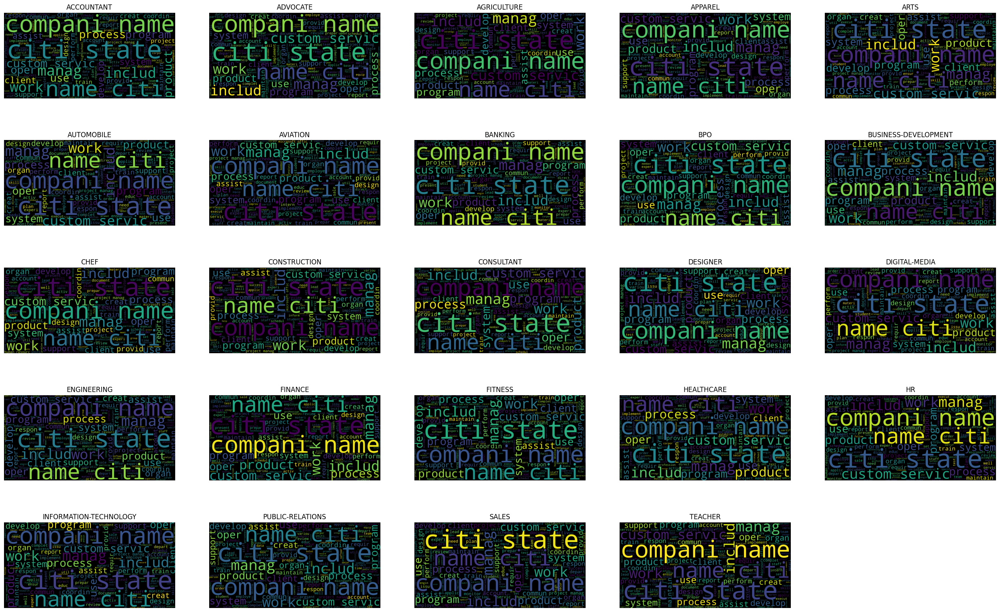

In [27]:
plt.figure(figsize=(32, 20))

for i, category in enumerate(categories):
    wc = wordcloud(df_categories[i])

    plt.subplot(5, 5, i + 1).set_title(category)
    plt.imshow(wc)
    plt.axis('off')
    plt.plot()

plt.show()
plt.close()

In [28]:
def remove_extra_wordtext(text):

    extra_word = ['compani','name','citi','state','work','manag']
    words = text.split()

    filter_word = [word for word in words if word not in extra_word]

    filter_text = ' '.join(filter_word)

    return filter_text

In [29]:
resume_data['Cleaned_Resume'] = resume_data['Cleaned_Resume'].apply(lambda x: remove_extra_wordtext(x))


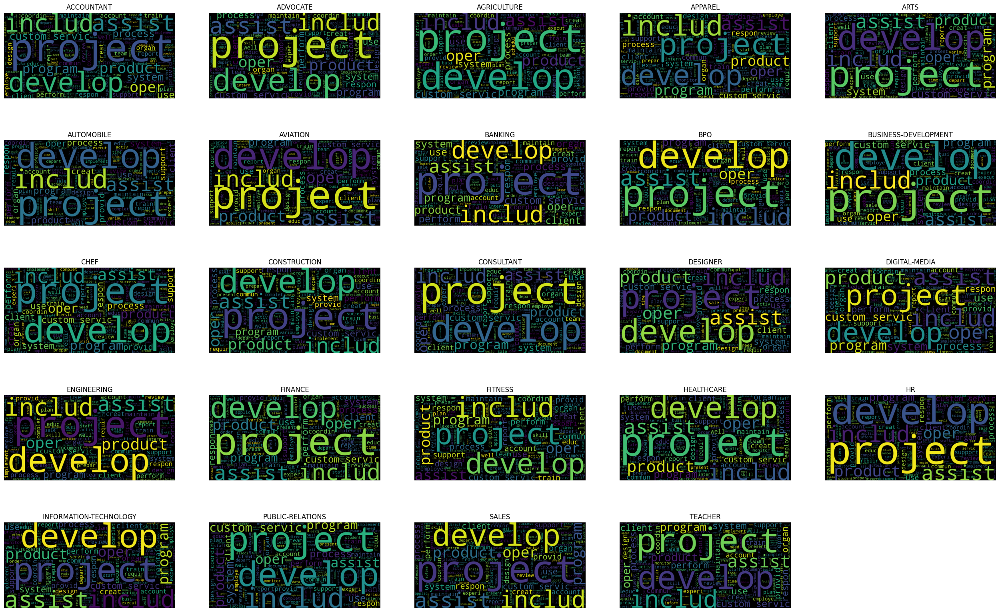

In [30]:
plt.figure(figsize=(32, 20))

for i, category in enumerate(categories):
    wc = wordcloud(df_categories[i])

    plt.subplot(5, 5, i + 1).set_title(category)
    plt.imshow(wc)
    plt.axis('off')
    plt.plot()

plt.show()
plt.close()

# Preprocessing and Encoding 

In [37]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

resume_data['Category'] = encoder.fit_transform(resume_data['Category'])
resume_data

,ID,Category,Cleaned_Resume
1443,16066857,10,senior execut chef execut profil seek employ e...
56,52979663,19,senior hr highlight safeti managementemploye e...
1131,15281412,12,consult summari transit applic develop secur p...
2472,16279537,6,supervisori logist specialist summari target f...
1710,24647794,15,engin intern profil profici entri level electr...
...,...,...,...
79,29091445,19,hr associ mobil coordin summari profession ext...
233,26801767,20,director inform technolog profession summari r...
2196,35483925,7,partner account execut summari year custom fac...
2303,19724031,4,volunt summari student passion make differ wor...


# Dataset splitting

In [38]:
# Split data into training and validation
X_train, X_valid, y_train, y_valid = train_test_split(resume_data['Cleaned_Resume'], resume_data['Category'], test_size=0.15, random_state=42, stratify=resume_data['Category'])


# Print the sizes of the split datasets
print("Train data size:", X_train.shape)
print("Validation data size:", X_valid.shape)

Train data size: (1793,)
Validation data size: (317,)


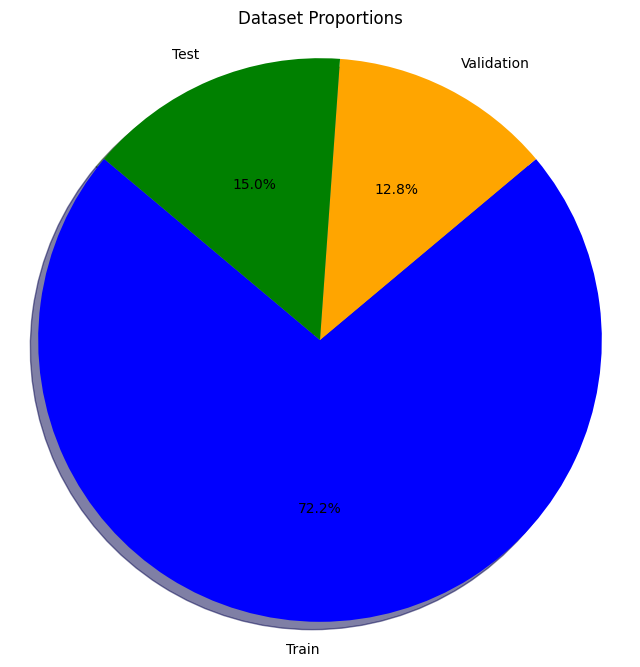

In [39]:
train_size = X_train.shape[0]
val_size = X_valid.shape[0]
test_size=resume_test_data.shape[0]  # our test data, which is separate from the full data

# Labels for the pie chart
labels = ['Train', 'Validation', 'Test']

# Sizes of the pie slices
sizes = [train_size, val_size, test_size]

# Colors for each slice
colors = ['blue', 'orange', 'green']
# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, colors=colors, shadow=True, autopct='%1.1f%%', startangle=140)
plt.title('Dataset Proportions')
plt.axis('equal')  
plt.show()


# Vectorization of the TF-IDF

In [40]:
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer


In [41]:
tfidf=TfidfVectorizer(stop_words='english',max_features=2000)

#fit and transfrom all dataset
tfidf_train_vectors = tfidf.fit_transform(X_train)
tfidf_valid_vectors =tfidf.transform(X_valid)

In [42]:
tfidf.get_feature_names_out()

array(['abil', 'abl', 'absenc', ..., 'youth', 'yr', 'zero'], dtype=object)

<div style="color:Black; display:fill; border-radius:5px;background-color:#336b87;font-size:200%;
font-family:sans-serif;letter-spacing:0.5px;text-align: center">Machine Learning Classifier</div>

In this study, We use to Basic Classifier which are related to work with Text such as (**Random Forest classifier,Logistic Regresssion,K-Nearest Neighbors,Naive Bayes and Support Vector Machine**) and also used advanced Technique such as (**Artificial Neural Network**).

In [43]:
accuracy_lis = []
model_lis = []

## Random Forest Classifier

In [45]:
from sklearn.ensemble import RandomForestClassifier

In [46]:
RF = RandomForestClassifier()

RF.fit(tfidf_train_vectors,y_train)
y_val_pred = RF.predict(tfidf_valid_vectors)

In [47]:
print("Classification Report (Validation Data): \n")
print(classification_report(y_valid, y_val_pred))

Classification Report (Validation Data): 

              precision    recall  f1-score   support

           0       0.52      0.80      0.63        15
           1       0.79      0.73      0.76        15
           2       0.00      0.00      0.00         8
           3       1.00      0.58      0.74        12
           4       0.25      0.15      0.19        13
           5       1.00      0.20      0.33         5
           6       0.85      0.73      0.79        15
           7       0.67      0.67      0.67        15
           8       0.00      0.00      0.00         3
           9       0.65      0.73      0.69        15
          10       0.75      1.00      0.86        15
          11       0.73      0.79      0.76        14
          12       0.33      0.13      0.19        15
          13       0.77      0.71      0.74        14
          14       0.70      0.58      0.64        12
          15       0.76      0.87      0.81        15
          16       0.58      0.47     

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [48]:
accuracy = accuracy_score(y_valid, y_val_pred)
print("Accuracy: ", accuracy)

model_lis.append('Random Forest Classifier')
accuracy_lis.append(accuracy)   

Accuracy:  0.6593059936908517


## LOGISTIC REGRESSION

In [49]:
# lR

LR = LogisticRegression()

LR.fit(tfidf_train_vectors,y_train)
# Predict on validation data
y_val_pred = LR.predict(tfidf_valid_vectors)

# Print classification report for validation data
print("Classification Report (Validation Data):\n")
print(classification_report(y_valid, y_val_pred))

print("Accuracy is : ", accuracy_score(y_valid, y_val_pred))

# store info
model_lis.append("Logistic Regression")
accuracy_lis.append(accuracy_score(y_valid, y_val_pred)*100)

Classification Report (Validation Data): 

              precision    recall  f1-score   support

           0       0.63      0.80      0.71        15
           1       0.47      0.60      0.53        15
           2       0.00      0.00      0.00         8
           3       0.88      0.58      0.70        12
           4       0.46      0.46      0.46        13
           5       1.00      0.20      0.33         5
           6       0.73      0.73      0.73        15
           7       0.73      0.53      0.62        15
           8       0.00      0.00      0.00         3
           9       0.59      0.67      0.62        15
          10       0.78      0.93      0.85        15
          11       0.80      0.57      0.67        14
          12       0.40      0.13      0.20        15
          13       0.69      0.79      0.73        14
          14       0.75      0.50      0.60        12
          15       0.62      0.67      0.65        15
          16       0.57      0.53     

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## K-Nearest Neighbors (KNN) Classifier

In [50]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score


knn = KNeighborsClassifier(n_neighbors=5)  # Set k=5 (can be tuned)
knn.fit(tfidf_train_vectors, y_train) 


y_val_pred = knn.predict(tfidf_valid_vectors)

# Print classification report for validation data
print("Classification Report (Validation Data):\n")
print(classification_report(y_valid, y_val_pred))

print("Accuracy is : ", accuracy_score(y_valid, y_val_pred))

# store info
model_lis.append("K Nearest Neighbors")
accuracy_lis.append(accuracy_score(y_valid, y_val_pred)*100)

Classification Report (Validation Data):

              precision    recall  f1-score   support

           0       0.42      0.73      0.54        15
           1       0.27      0.67      0.38        15
           2       1.00      0.12      0.22         8
           3       0.67      0.33      0.44        12
           4       0.44      0.31      0.36        13
           5       0.20      0.20      0.20         5
           6       0.75      0.60      0.67        15
           7       0.60      0.40      0.48        15
           8       0.00      0.00      0.00         3
           9       0.60      0.60      0.60        15
          10       0.72      0.87      0.79        15
          11       0.73      0.57      0.64        14
          12       0.45      0.33      0.38        15
          13       0.71      0.86      0.77        14
          14       0.60      0.50      0.55        12
          15       0.64      0.60      0.62        15
          16       0.55      0.40      

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## Naive Bayes Classifier

In [51]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
param_grid = {'alpha': [0.01, 0.1, 0.5, 1]}
grid_search = GridSearchCV(MultinomialNB(), param_grid, cv=5)
grid_search.fit(tfidf_train_vectors, y_train)


# Print classification report for validation data
print("Classification Report (Validation Data):\n")
print(classification_report(y_valid, y_val_pred))

print("Accuracy is : ", accuracy_score(y_valid, y_val_pred))

# store info
model_lis.append("Naive Bayes")
accuracy_lis.append(accuracy_score(y_valid, y_val_pred)*100)


Classification Report (Validation Data):

              precision    recall  f1-score   support

           0       0.42      0.73      0.54        15
           1       0.27      0.67      0.38        15
           2       1.00      0.12      0.22         8
           3       0.67      0.33      0.44        12
           4       0.44      0.31      0.36        13
           5       0.20      0.20      0.20         5
           6       0.75      0.60      0.67        15
           7       0.60      0.40      0.48        15
           8       0.00      0.00      0.00         3
           9       0.60      0.60      0.60        15
          10       0.72      0.87      0.79        15
          11       0.73      0.57      0.64        14
          12       0.45      0.33      0.38        15
          13       0.71      0.86      0.77        14
          14       0.60      0.50      0.55        12
          15       0.64      0.60      0.62        15
          16       0.55      0.40      

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## Support Vector Machine (SVM) Classifier

In [52]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score

# Initialize SVM model with linear kernel
svm = SVC(kernel='linear', C=1.0, random_state=42)

# Train the model
svm.fit(tfidf_train_vectors, y_train)

# Predict on validation data
y_val_pred = svm.predict(tfidf_valid_vectors)

print("Classification Report (Validation Data):\n")
print(classification_report(y_valid, y_val_pred))

print("Accuracy is : ", accuracy_score(y_valid, y_val_pred))

model_lis.append("SVM")
accuracy_lis.append(accuracy_score(y_valid, y_val_pred)*100)




Classification Report (Validation Data):

              precision    recall  f1-score   support

           0       0.61      0.73      0.67        15
           1       0.55      0.73      0.63        15
           2       0.00      0.00      0.00         8
           3       0.67      0.67      0.67        12
           4       0.39      0.54      0.45        13
           5       1.00      0.20      0.33         5
           6       0.83      0.67      0.74        15
           7       0.64      0.60      0.62        15
           8       0.00      0.00      0.00         3
           9       0.61      0.73      0.67        15
          10       0.93      0.93      0.93        15
          11       0.80      0.57      0.67        14
          12       0.30      0.20      0.24        15
          13       0.69      0.64      0.67        14
          14       0.86      0.50      0.63        12
          15       0.67      0.67      0.67        15
          16       0.64      0.60      

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

D:\Data Science Machine Learning\Data science Projects\Resume Scanner\ven\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## Deep Learning Approach

In [53]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from keras.utils import to_categorical

In [56]:
# Convert sparse matrices to dense arrays
tfidf_train_arrays = tfidf_train_vectors.toarray()
tfidf_valid_arrays = tfidf_valid_vectors.toarray()

# Build a simple neural network model
num_classes = 24

y_train_label = to_categorical(y_train, num_classes=num_classes)
y_valid_label = to_categorical(y_valid, num_classes=num_classes)
# Build a more complex neural network model
model = Sequential()
model.add(Dense(1000, input_dim=tfidf_train_arrays.shape[1]))
model.add(Dense(500, activation='relu'))
model.add(Dense(200, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))  # Use softmax for multi-class classification

# Compile the model with a lower learning rate
model.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), metrics=['accuracy'])

# Train the model with more epochs
history = model.fit(tfidf_train_arrays, y_train_label, epochs=50, batch_size=32, validation_data=(tfidf_valid_arrays, y_valid_label))

# Evaluate the model on the validation set
loss, accuracy = model.evaluate(tfidf_valid_arrays, y_valid_label)
print(f"Validation loss: {loss:.4f}")
print(f"Validation accuracy: {accuracy:.4f}")

# store info
model_lis.append("Artificial Neural Network")
accuracy_lis.append(accuracy_score(y_valid, y_val_pred)*100)


Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - accuracy: 0.3128 - loss: 2.7316 - val_accuracy: 0.5142 - val_loss: 1.7264
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.6934 - loss: 1.0959 - val_accuracy: 0.6057 - val_loss: 1.4490
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.9008 - loss: 0.4278 - val_accuracy: 0.5962 - val_loss: 1.6718
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9622 - loss: 0.1321 - val_accuracy: 0.6025 - val_loss: 1.8092
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.9960 - loss: 0.0323 - val_accuracy: 0.6372 - val_loss: 1.8159
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.9989 - loss: 0.0111 - val_accuracy: 0.6278 - val_loss: 1.8565
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 1.0000 - loss: 0.0040 - val_accuracy: 0.6404 - val_loss: 1.8906
Epoch 8/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 1.0000 - loss: 0.0026 - val_accuracy: 0.6404 - v

# Check training accuracy and validation accuracy and training loss and validation loss

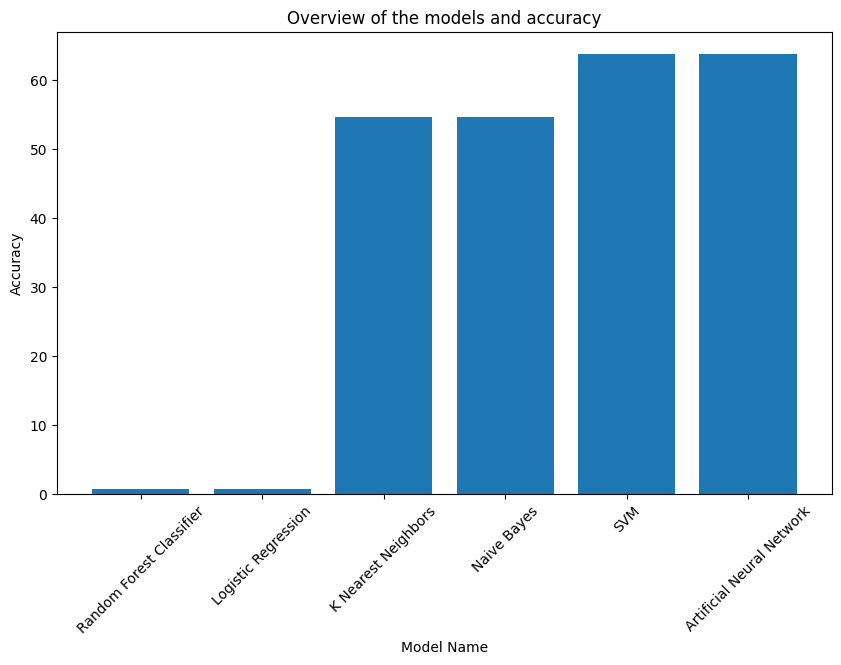

In [57]:
# Create a DataFrame
accuracy_data = pd.DataFrame({'model': model_lis, 'accuracy': accuracy_lis})

# Plot the data
plt.figure(figsize=(10, 6))
plt.bar(accuracy_data['model'], accuracy_data['accuracy'])
plt.xlabel('Model Name')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
plt.title('Overview of the models and accuracy')
plt.show()

In [58]:
accuracy_data

,model,accuracy
0,Random Forest Classifier,0.659306
1,Logistic Regression,0.634069
2,K Nearest Neighbors,54.574132
3,Naive Bayes,54.574132
4,SVM,63.722397
5,Artificial Neural Network,63.722397


In [59]:
import pickle
pickle.dump(tfidf,open('tfidf.pkl', 'wb'))
pickle.dump(RF,open('best_clf.pkl', 'wb'))

In [60]:
category_mapping = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))

In [61]:
category_mapping

{np.int64(0): np.int64(0),
 np.int64(1): np.int64(1),
 np.int64(2): np.int64(2),
 np.int64(3): np.int64(3),
 np.int64(4): np.int64(4),
 np.int64(5): np.int64(5),
 np.int64(6): np.int64(6),
 np.int64(7): np.int64(7),
 np.int64(8): np.int64(8),
 np.int64(9): np.int64(9),
 np.int64(10): np.int64(10),
 np.int64(11): np.int64(11),
 np.int64(12): np.int64(12),
 np.int64(13): np.int64(13),
 np.int64(14): np.int64(14),
 np.int64(15): np.int64(15),
 np.int64(16): np.int64(16),
 np.int64(17): np.int64(17),
 np.int64(18): np.int64(18),
 np.int64(19): np.int64(19),
 np.int64(20): np.int64(20),
 np.int64(21): np.int64(21),
 np.int64(22): np.int64(22),
 np.int64(23): np.int64(23)}

In [62]:
categories

array(['ACCOUNTANT', 'ADVOCATE', 'AGRICULTURE', 'APPAREL', 'ARTS',
       'AUTOMOBILE', 'AVIATION', 'BANKING', 'BPO', 'BUSINESS-DEVELOPMENT',
       'CHEF', 'CONSTRUCTION', 'CONSULTANT', 'DESIGNER', 'DIGITAL-MEDIA',
       'ENGINEERING', 'FINANCE', 'FITNESS', 'HEALTHCARE', 'HR',
       'INFORMATION-TECHNOLOGY', 'PUBLIC-RELATIONS', 'SALES', 'TEACHER'],
      dtype=object)

In [63]:
category_mapping = {category: idx for idx, category in enumerate(categories)}


In [64]:
category_mapping

{'ACCOUNTANT': 0,
 'ADVOCATE': 1,
 'AGRICULTURE': 2,
 'APPAREL': 3,
 'ARTS': 4,
 'AUTOMOBILE': 5,
 'AVIATION': 6,
 'BANKING': 7,
 'BPO': 8,
 'BUSINESS-DEVELOPMENT': 9,
 'CHEF': 10,
 'CONSTRUCTION': 11,
 'CONSULTANT': 12,
 'DESIGNER': 13,
 'DIGITAL-MEDIA': 14,
 'ENGINEERING': 15,
 'FINANCE': 16,
 'FITNESS': 17,
 'HEALTHCARE': 18,
 'HR': 19,
 'INFORMATION-TECHNOLOGY': 20,
 'PUBLIC-RELATIONS': 21,
 'SALES': 22,
 'TEACHER': 23}